In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from matplotlib.animation import FuncAnimation
from cmath import rect
from textwrap import dedent as dd

%config InlineBackend.figure_format = 'retina'
sns.set()
mpl.rc('figure', figsize=(8, 8), dpi=300)    # width * dpi = 2400
mpl.rc('animation', html='html5')

In [3]:
%%capture

# Random seeds

seeds = np.array([rect(1, 0)])

fig = plt.figure(tight_layout=True)
ax0 = fig.add_subplot(111, projection='polar')
ax0.set_ylim(0, 20)
ax0.plot(np.linspace(0, 2*np.pi, 360), np.ones(360), 'r', label="Meristem")
ln0, = ax0.plot(np.angle(seeds), np.abs(seeds), ".", label="Seeds")
fig.legend()

def draw(t):
    global seeds
    
    seeds += seeds / np.abs(seeds)    # Growing
    angle = np.angle(seeds[-1]) + np.random.rand()*2*np.pi
    seeds = np.hstack((seeds, rect(1, angle)))
    
    ln0.set_data(np.angle(seeds), np.abs(seeds))
    return ln0,


anim = FuncAnimation(fig, draw, 20, interval=300, blit=True)
anim.save("random_small.mp4")

In [4]:
%%capture

# Seeds in a row

seeds = np.array([rect(1, 0)])

fig = plt.figure(tight_layout=True)
ax0 = fig.add_subplot(111, projection='polar')
ax0.set_ylim(0, 20)
ax0.plot(np.linspace(0, 2*np.pi, 360), np.ones(360), 'r', label="Meristem")
ln0, = ax0.plot(np.angle(seeds), np.abs(seeds), ".", label="Seeds")
fig.legend()

def draw(t):
    global seeds
    
    seeds += seeds / np.abs(seeds)    # Growing
    angle = np.angle(seeds[-1])
    seeds = np.hstack((seeds, rect(1, angle)))
    
    ln0.set_data(np.angle(seeds), np.abs(seeds))
    return ln0,

anim = FuncAnimation(fig, draw, 20, interval=300, blit=True)
anim.save("same_small.mp4")

In [5]:
%%capture

# Seeds arranged with golden angle

def draw(t):
    global seeds
    
    seeds += seeds / np.abs(seeds)    # Growing
    angle = np.angle(seeds[-1]) + np.pi*(3 - 5**.5)
    seeds = np.hstack((seeds, rect(1, angle)))
    
    ln0.set_data(np.angle(seeds), np.abs(seeds))
    return ln0,


# Zoomed-in

seeds = np.array([rect(1, 0)])

fig = plt.figure(tight_layout=True)
ax0 = fig.add_subplot(111, projection='polar')
ax0.set_ylim(0, 20)
ax0.plot(np.linspace(0, 2*np.pi, 360), np.ones(360), 'r', label="Meristem")
ln0, = ax0.plot(np.angle(seeds), np.abs(seeds), ".", label="Seeds")
fig.legend()

anim = FuncAnimation(fig, draw, 20, interval=300, blit=True)
anim.save("golden_small.mp4")


# Zoomed-out

seeds = np.array([rect(1, 0)])

fig = plt.figure(tight_layout=True)
ax0 = fig.add_subplot(111, projection='polar')
ax0.set_ylim(0, 500)
ln0, = ax0.plot(np.angle(seeds), np.abs(seeds), ".")

anim = FuncAnimation(fig, draw, 500, interval=50, blit=True)
anim.save("golden.mp4")

[0.         3.14159265 5.23598776 0.52359878 5.55014702]


/Users/onno/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:2362: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


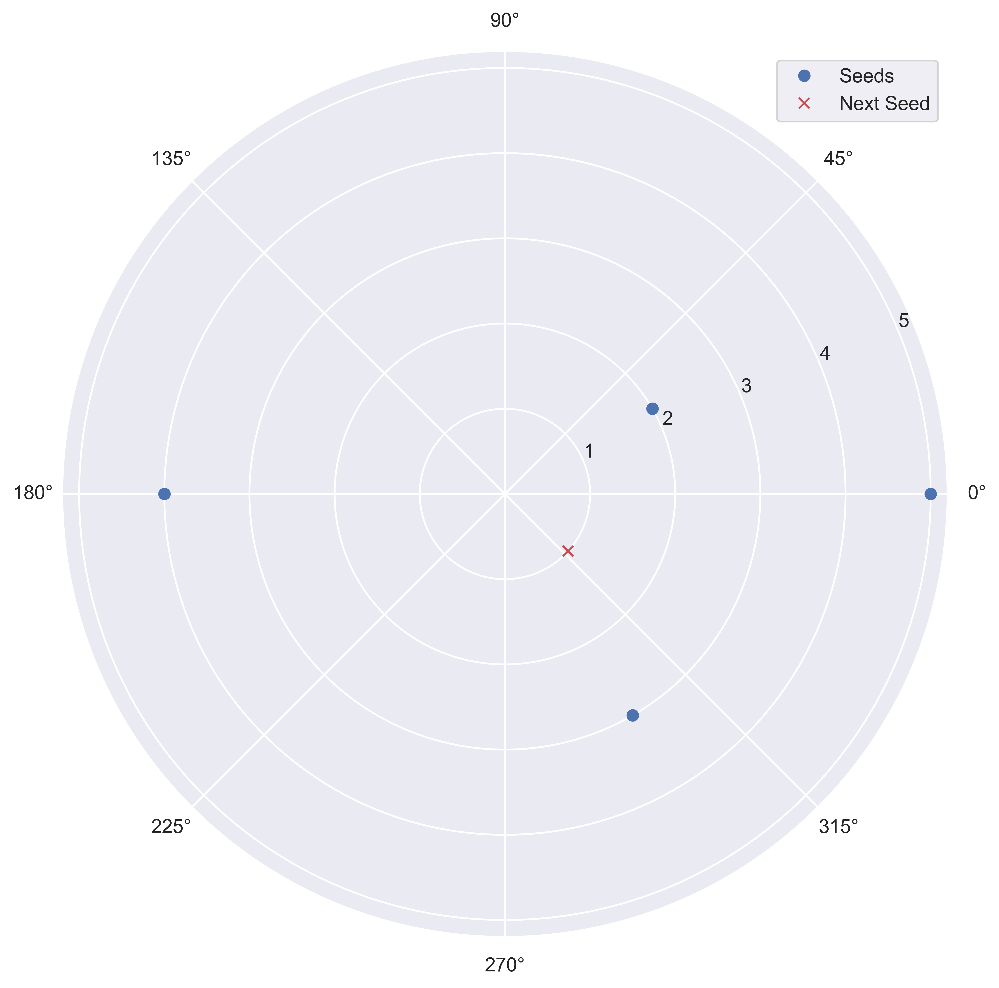

In [6]:
# First try, wrong calculation of mean angle

N = 5
theta = np.zeros(N)

for i in range(1, N):
    mean = 2 / (i * (i + 1)) * (theta[:i] * (np.r_[:i] + 1)).sum()    # Calculate the weighted "mean" angle
    theta[i] = (mean + np.pi) % (2*np.pi)                             # Invert angle (add pi) and adjust for mod 2pi

print(theta)

fig = plt.figure(tight_layout=True)
ax = fig.add_subplot(111, projection='polar')
ax.plot(theta[:-1], N - np.r_[:N-1], 'o', label="Seeds")
ax.plot(theta[-1], 1, 'rx', label="Next Seed")
plt.legend()
plt.savefig('wrong_mean.svg')

/Users/onno/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:2362: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


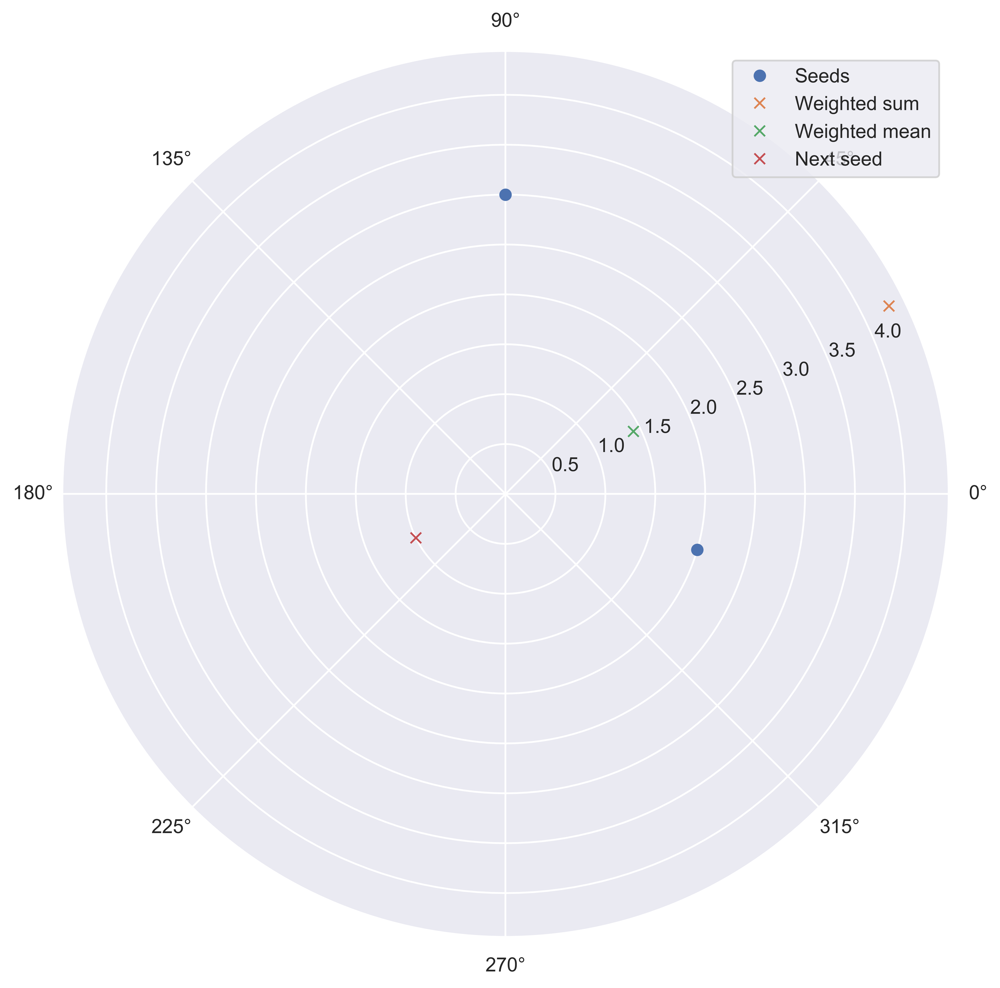

In [7]:
# Next try, calculate mean angle using complex numbers

seeds = np.array([rect(3, np.pi/2), rect(2, 6)])
sum_ = (seeds * (np.r_[:2] + 1)).sum()
mean = sum_ * 2 / (2 * (2 + 1))    # Multiplying a complex number by a real number does not change the argument
next_seed = rect(1, np.angle(sum_) + np.pi)

fig = plt.figure(tight_layout=True)
ax = fig.add_subplot(111, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), "o", label="Seeds")
ax.plot(np.angle(sum_), np.abs(sum_), "x", label="Weighted sum")
ax.plot(np.angle(mean), np.abs(mean), "x", label="Weighted mean")
ax.plot(np.angle(next_seed), np.abs(next_seed), "x", label="Next seed")
plt.legend()
plt.savefig('complex_angles.svg')

/Users/onno/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:2362: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


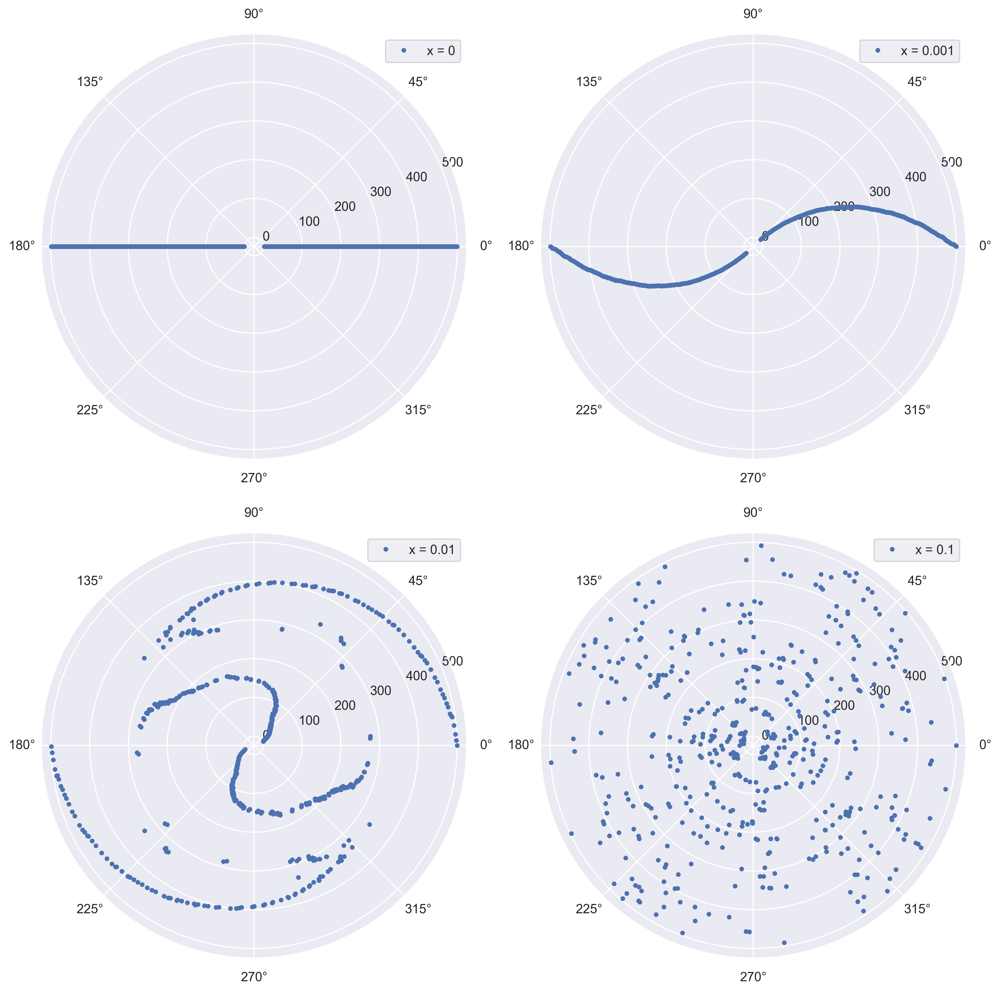

In [8]:
# Testing of complex-mean method

def complex_seeds(x):
    seeds = np.array([rect(1, 0)])

    for i in range(1, 500):
        seeds += seeds / np.abs(seeds)    # Growing
        sum_ = (seeds * (np.r_[:i] + 1)).sum()
        next_seed = rect(1, np.angle(sum_) + np.pi + np.random.rand()*x)
        seeds = np.hstack((seeds, next_seed))
        
    return seeds


fig = plt.figure(figsize=(12, 12), dpi=200, tight_layout=True)
seeds = complex_seeds(0)
ax = fig.add_subplot(221, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), ".", label="x = 0")
ax.legend()
seeds = complex_seeds(1e-3)
ax = fig.add_subplot(222, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), ".", label="x = 0.001")
ax.legend()
seeds = complex_seeds(1e-2)
ax = fig.add_subplot(223, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), ".", label="x = 0.01")
ax.legend()
seeds = complex_seeds(1e-1)
ax = fig.add_subplot(224, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), ".", label="x = 0.1")
ax.legend()
fig.savefig('complex_stuff.svg')

/Users/onno/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:2362: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


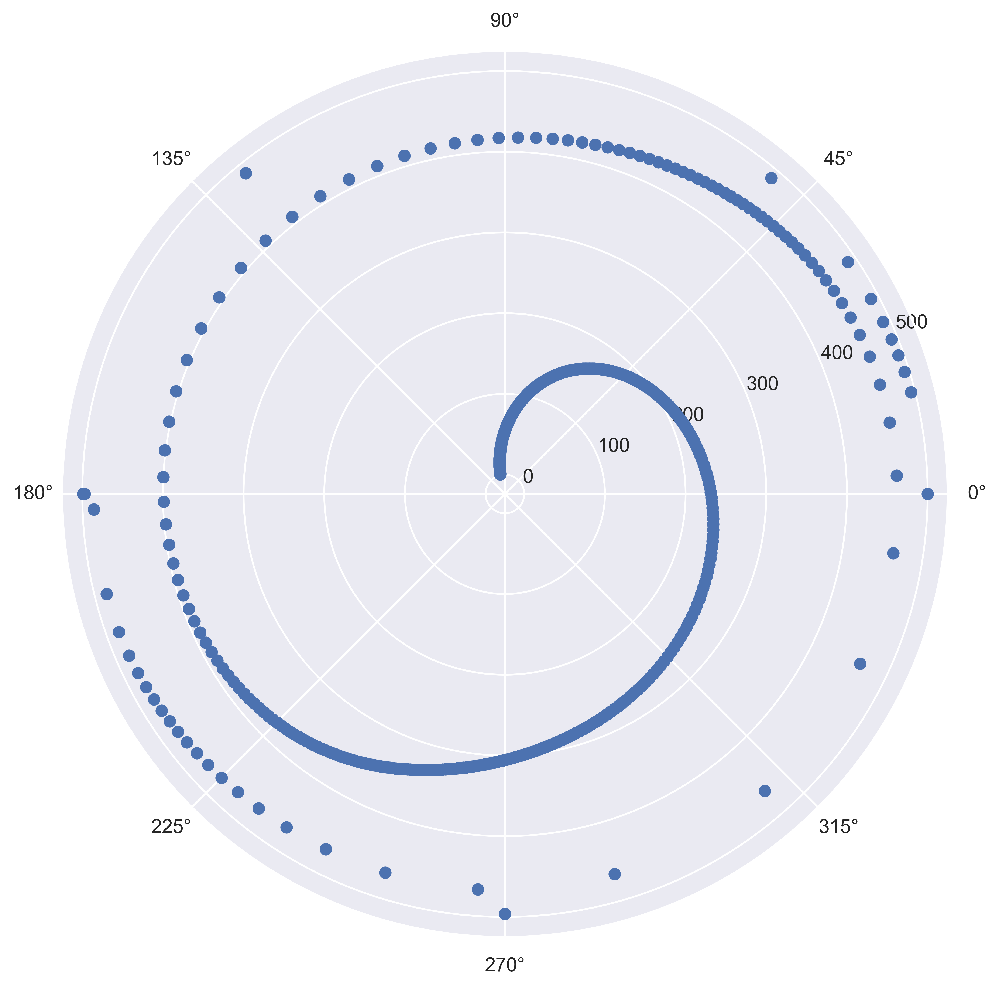

In [9]:
# This is what happens when calculating the mean with the weights flipped.. It's a spiral! (But only due to float errors)

seeds = np.array([rect(1, 0)])

for i in range(1, 500):
    seeds += seeds / np.abs(seeds)    # Growing
    sum_ = (seeds * (i - np.r_[:i])).mean()
    next_seed = rect(1, np.angle(sum_) + np.pi)
    seeds = np.hstack((seeds, next_seed))

fig = plt.figure(tight_layout=True)
ax = fig.add_subplot(111, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), "o")

plt.savefig('weird.svg')

In [10]:
# First energy function

x = np.linspace(0, 2*np.pi, 1000)    # Minimization resolution = 1000 (take the best of 1000 possible thetas)

def energy(seeds, x, a, b):
    N = len(seeds)
    i = np.r_['1,2', 1 : N+1].T
    phi = np.angle(seeds)[np.newaxis].T
    
    # Copy the whole function +- 2pi to emulate modularity
    E = 1/N**a * (np.sum(i**a * np.exp(-(N - i + 1)**b * (x - phi)**2), axis=0)
                  + np.sum(i**a * np.exp(-(N - i + 1)**b * (x + 2*np.pi - phi)**2), axis=0)
                  + np.sum(i**a * np.exp(-(N - i + 1)**b * (x - 2*np.pi - phi)**2), axis=0))
    return E

Next angle: 3.377447957913351 rad


/Users/onno/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:2362: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


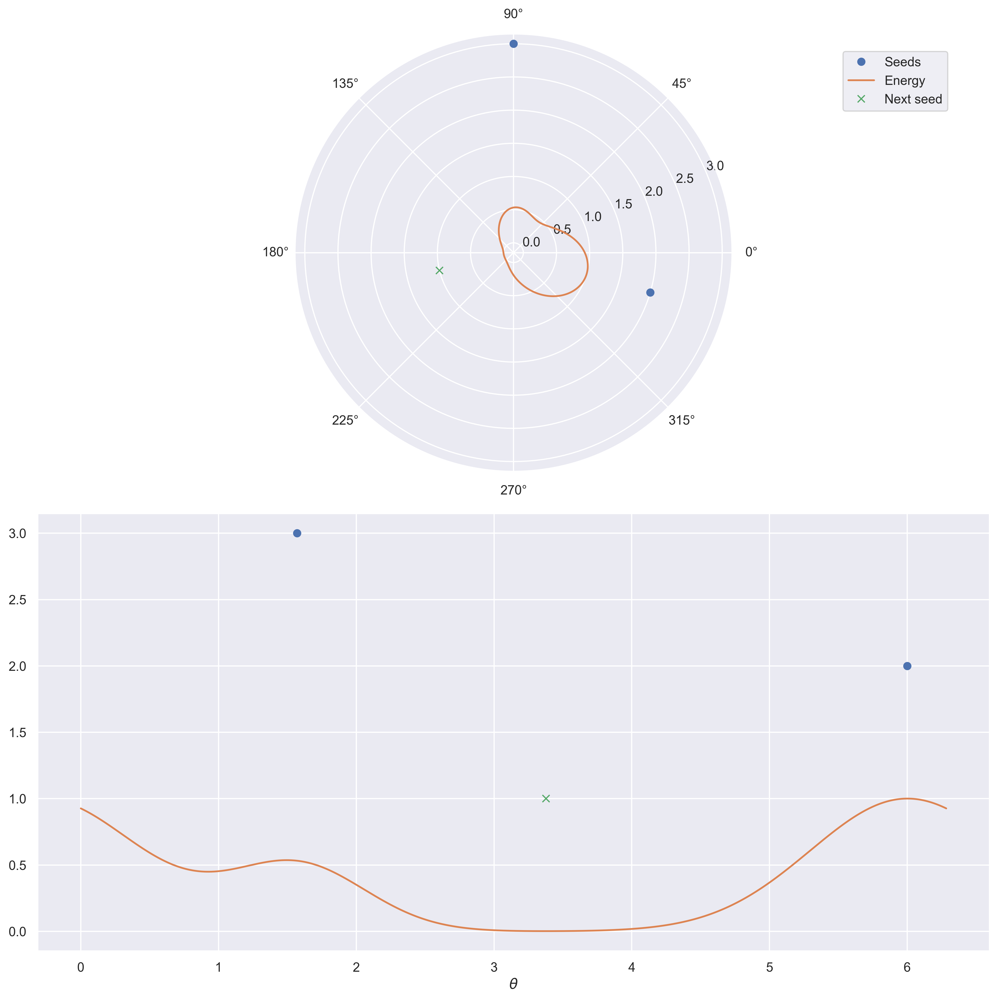

In [11]:
# Demo of energy function

seeds = np.array([rect(3, np.pi/2), rect(2, 6)])
E = energy(seeds, x, a=1, b=1)
angle = x[np.argmin(E)]    # Mimimize by just taking the coordinate of lowest energy value (resolution = 1000)
next_seed = rect(1, angle)

print(f"Next angle: {(np.angle(next_seed) + 2*np.pi) % (2*np.pi)} rad")

fig = plt.figure(figsize=(12, 12), dpi=200, tight_layout=True)
ax = fig.add_subplot(211, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), "o", label="Seeds")
ax.plot(x, E, label="Energy")
ax.plot(np.angle(next_seed), np.abs(next_seed), "x", label="Next seed")
ax = fig.add_subplot(212)
ax.set_xlabel("$\\theta$")
ax.plot((np.angle(seeds) + 2*np.pi) % (2*np.pi), np.abs(seeds), "o")
ax.plot(x, E)
ax.plot((np.angle(next_seed) + 2*np.pi) % (2*np.pi), np.abs(next_seed), "x")
fig.legend(borderaxespad=4)
fig.savefig('energy1_demo.svg')

/Users/onno/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:2362: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


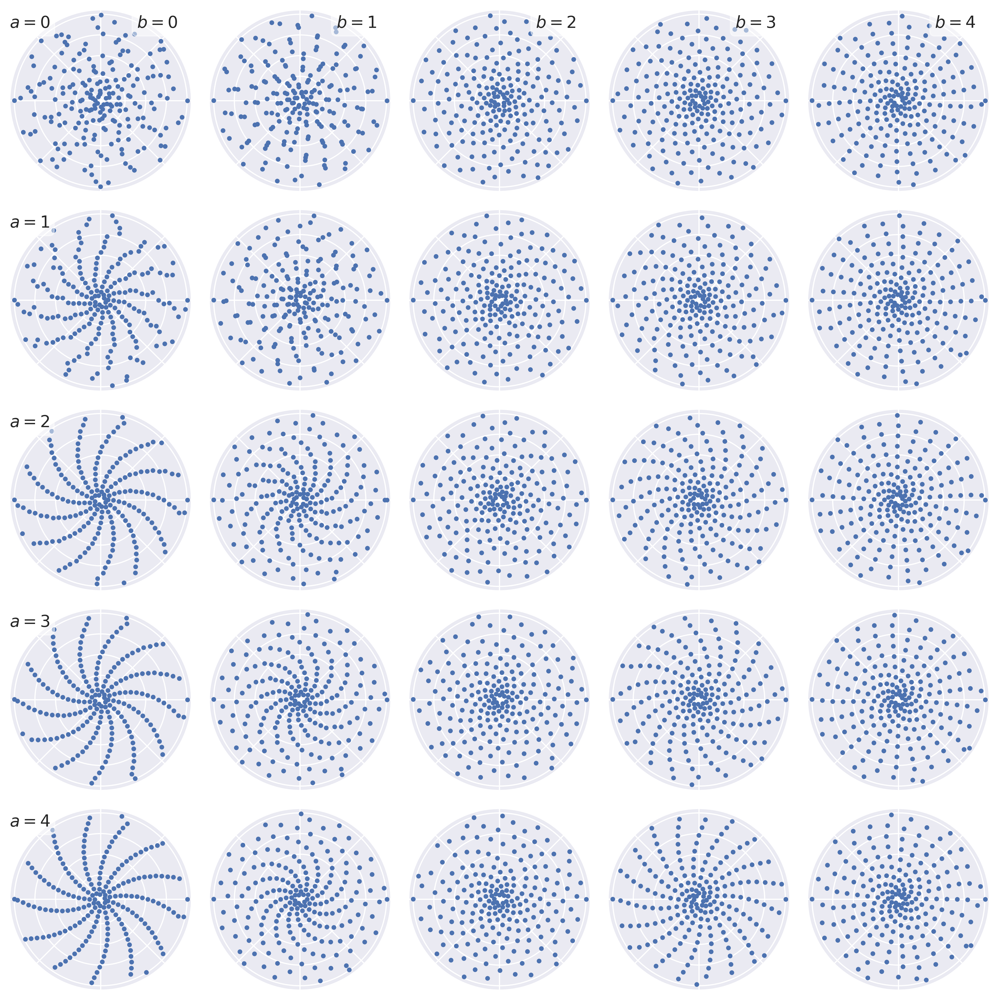

/Users/onno/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:2362: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


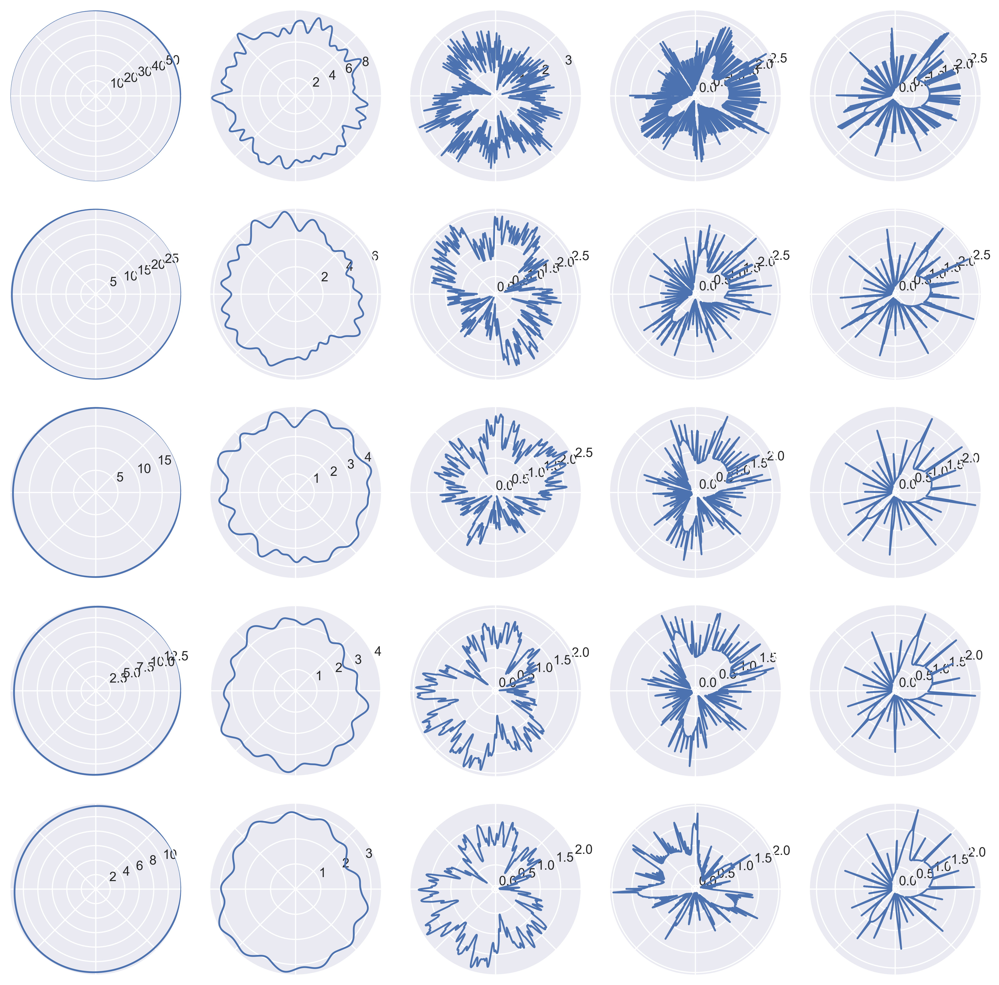

/Users/onno/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:2362: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


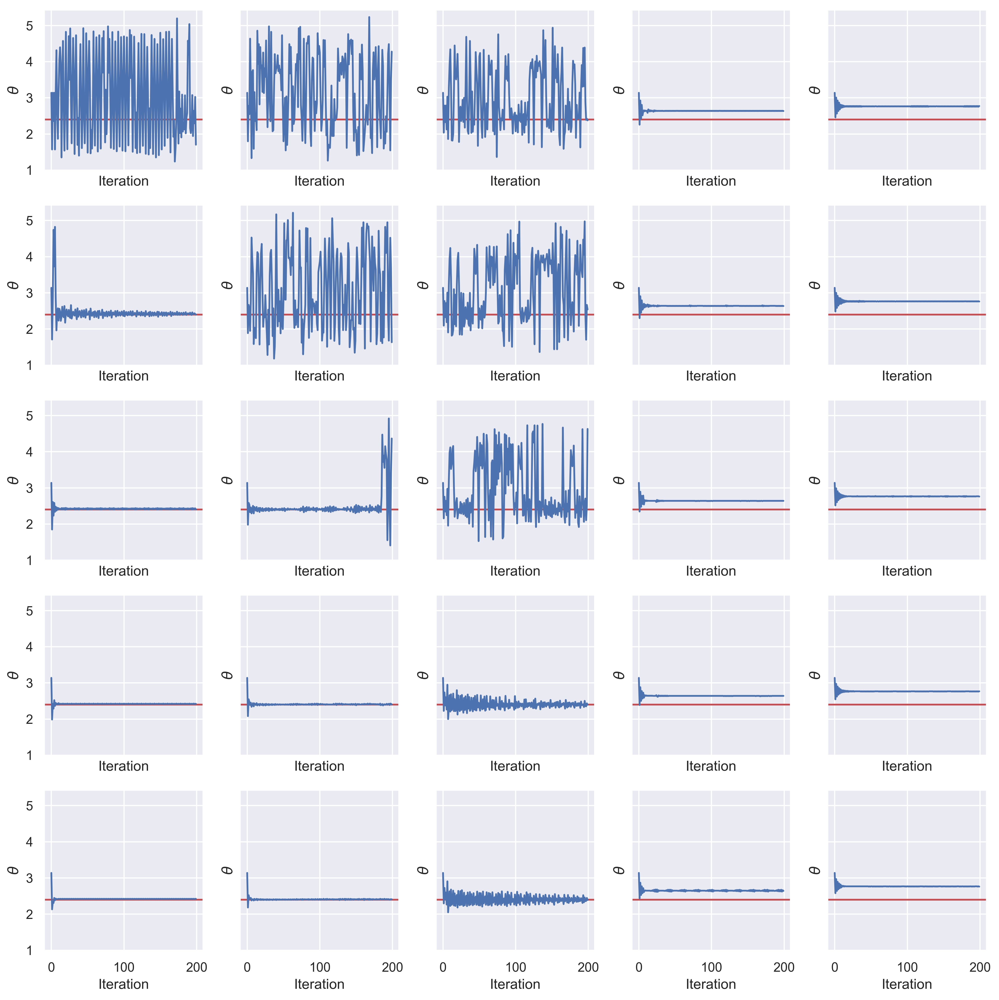

In [12]:
# Test all combinations of parameters a and b from 0 to 4

def seeds(a, b):
    seeds = np.array([rect(1, 0)])
    
    for i in range(200):
        seeds += seeds / np.abs(seeds)    # Growing
        angle = x[np.argmin(energy(seeds, x, a, b))]
        seeds = np.hstack((seeds, rect(1, angle)))
        
    return seeds


fig = plt.figure(figsize=(12, 12), dpi=200, tight_layout=True)
for a in range(5):
    for b in range(5):
        s = seeds(a, b)
        ax = fig.add_subplot(5, 5, 5*a + b + 1, projection='polar')
        ax.yaxis.set_major_formatter(plt.NullFormatter())
        ax.xaxis.set_major_formatter(plt.NullFormatter())
        if b == 0:
            ax.annotate(f"$a = {a}$",
                        xy=(0, .9), 
                        xycoords='axes fraction',
                        size=14,
                        bbox=dict(boxstyle="round", fc=(1, 1, 1), alpha=.5))
        if a == 0:
            ax.annotate(f"$b = {b}$",
                        xy=(.7, .9), 
                        xycoords='axes fraction',
                        size=14,
                        bbox=dict(boxstyle="round", fc=(1, 1, 1), alpha=.5))
        ax.plot(np.angle(s), np.abs(s), ".")
        
fig.savefig('many_seeds.svg')


fig = plt.figure(figsize=(12, 12), dpi=200, tight_layout=True)
for a in range(5):
    for b in range(5):
        s = seeds(a, b)
        ax = fig.add_subplot(5, 5, 5*a + b + 1, projection='polar')
        ax.xaxis.set_major_formatter(plt.NullFormatter())
        ax.plot(x, energy(s, x, a, b))
        
fig.savefig('many_energies.svg')


fig, ax = plt.subplots(5, 5, sharex=True, sharey=True, figsize=(12, 12), dpi=200, tight_layout=True)
for a in range(5):
    for b in range(5):
        s = seeds(a, b)
        angles = (np.diff(np.angle(s)) + 2*np.pi) % (2*np.pi)
        ax[a, b].set_xlabel("Iteration")
        ax[a, b].set_ylabel("$\\theta$")
        ax[a, b].axhline(np.pi*(3 - 5**.5), color='r')
        ax[a, b].plot(angles)
        
fig.savefig('many_iterations.svg')

Final angle: 2.47
Error:       1.59%


/Users/onno/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:2362: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


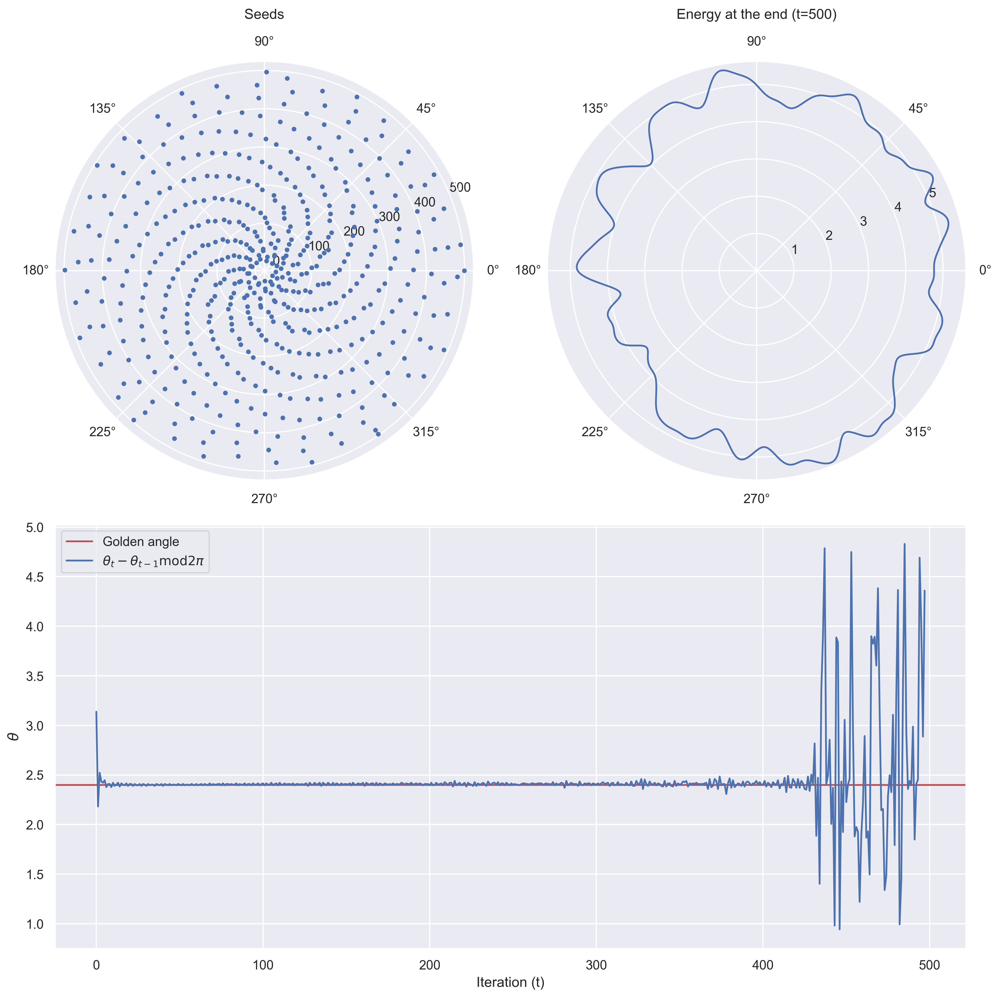

In [13]:
# Test best parameter values (simulate 500 seeds)

a = 4
b = 1

seeds = np.array([rect(1, 0)])

for i in range(2, 500):
    seeds += seeds / np.abs(seeds)
    angle = x[np.argmin(energy(seeds, x, a=a, b=b))]
    seeds = np.hstack((seeds, rect(1, angle)))

E = energy(seeds, x, a=a, b=b)    # Energy at the end of simulation

angles = (np.diff(np.angle(seeds)) + 2*np.pi) % (2*np.pi)
fa = angles[int(len(angles)/3):].mean()    # Final angle: mean angle of last 2/3 of the simulation
print(dd(f"""\
         Final angle: {fa:.2f}
         Error:       {abs(fa - np.pi*(3 - 5**.5)) / np.pi*(3 - 5**.5) * 100 :.2f}%"""))

fig = plt.figure(figsize=(12, 12), dpi=200, tight_layout=True)
ax = fig.add_subplot(221, projection='polar')
ax.set_title("Seeds\n")
ax.plot(np.angle(seeds), np.abs(seeds), ".")
ax = fig.add_subplot(222, projection='polar')
ax.set_title("Energy at the end (t=500)\n")
ax.plot(x, E)
ax = fig.add_subplot(212)
ax.set_ylabel("$\\theta$")
ax.set_xlabel("Iteration (t)")
ax.axhline(np.pi*(3 - 5**.5), color='r', label="Golden angle")
ax.plot(angles, label="$\\theta_t - \\theta_{t - 1} \\mathrm{mod} 2\\pi$")
ax.legend()
fig.savefig('not_very_good.svg')

In [14]:
# Second energy function

# Instead of np.linspace: add more points around x, provide a better resolution in the meaningful region
def curvedspace(a, b, x, num=50):
    s = np.linspace(np.cbrt(a - x), np.cbrt(b - x), num)
    return s**3 + x

x = curvedspace(0, 2*np.pi, np.pi*(3 - 5**.5), 1000)

def energy(seeds, x):
    N = len(seeds)
    Z = N
    i = np.r_['0,2', N-Z:N].T
    phi = (np.angle(seeds)[-Z:][np.newaxis].T + 2*np.pi) % (2*np.pi)
    s = (1 - i/N)
    E = (np.sum(np.exp(-(x - phi)**2) / s, axis=0)
        + np.sum(np.exp(-(x + 2*np.pi - phi)**2) / s, axis=0)
        + np.sum(np.exp(-(x + 4*np.pi - phi)**2) / s, axis=0)
        + np.sum(np.exp(-(x - 2*np.pi - phi)**2) / s, axis=0)
        + np.sum(np.exp(-(x - 4*np.pi - phi)**2) / s, axis=0)) / N
    return E

Next angle: 3.6987772510159513 rad


/Users/onno/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:2362: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


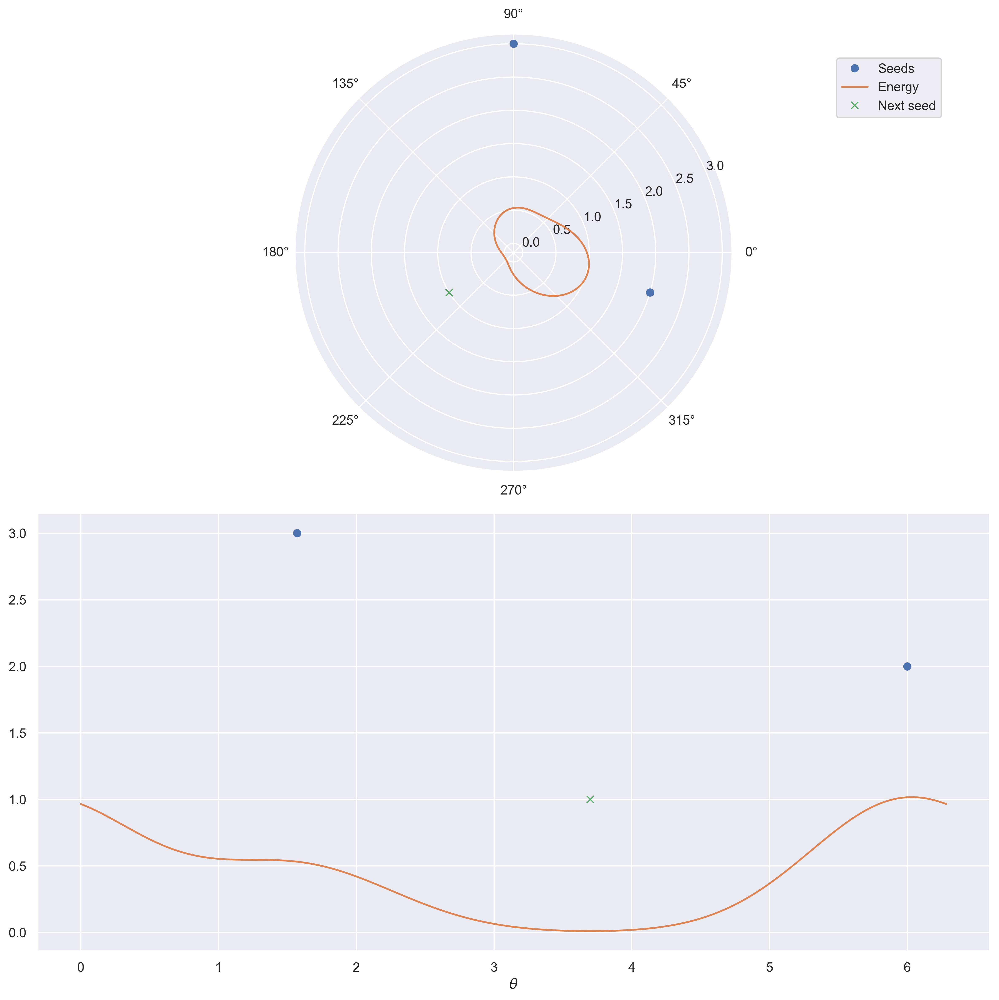

In [15]:
# Demo of energy function

seeds = np.array([rect(3, np.pi/2), rect(2, 6)])
E = energy(seeds, x)
angle = x[np.argmin(E)]    # Mimimize by just taking the coordinate of lowest energy value (resolution = 1000)
next_seed = rect(1, angle)

print(f"Next angle: {(np.angle(next_seed) + 2*np.pi) % (2*np.pi)} rad")

fig = plt.figure(figsize=(12, 12), dpi=200, tight_layout=True)
ax = fig.add_subplot(211, projection='polar')
ax.plot(np.angle(seeds), np.abs(seeds), "o", label="Seeds")
ax.plot(x, E, label="Energy")
ax.plot(np.angle(next_seed), np.abs(next_seed), "x", label="Next seed")
ax = fig.add_subplot(212)
ax.set_xlabel("$\\theta$")
ax.plot((np.angle(seeds) + 2*np.pi) % (2*np.pi), np.abs(seeds), "o")
ax.plot(x, E)
ax.plot((np.angle(next_seed) + 2*np.pi) % (2*np.pi), np.abs(next_seed), "x")
fig.legend(borderaxespad=4)
fig.savefig('energy2_demo.svg')

In [16]:
%%capture

# Simulation with the new energy function

a = np.full(500, np.nan)
i = np.arange(500)
seeds = np.array([rect(1, 0)])

fig = plt.figure(figsize=(12, 12), dpi=200, tight_layout=True)
grid = plt.GridSpec(7, 2, wspace=0.4, hspace=0.3)

ax0 = fig.add_subplot(grid[:3, 0], projection='polar')
ax0.set_ylim(0, 500)
ax0.set_title("Seeds\n")
ln0, = ax0.plot(np.angle(seeds), np.abs(seeds), ".")
ax1 = fig.add_subplot(grid[:3, 1], projection='polar')
ax1.set_ylim(0, 3)
ax1.set_title("Energy\n")
ln1, = ax1.plot(x, 3*np.ones(x.shape))
ax3 = fig.add_subplot(grid[3, :])
ax3.axis('off')
ax2 = fig.add_subplot(grid[4:, :])
ax2.set_ylim(-.5, 2*np.pi + .5)
ax2.axhline(np.pi*(3 - 5**.5), color='r', label="Golden angle")
ax2.set_ylabel("$\\theta$")
ax2.set_xlabel("Iteration (t)")
ln2, = ax2.plot(i, np.zeros(500), label="$\\theta_t - \\theta_{t - 1} \\mathrm{mod} 2\\pi$")
ax2.legend()

def draw(t):
    global a, seeds
    E = np.exp(1j * x) * energy(seeds, x)
    seeds += seeds / np.abs(seeds)    # Growing
    angle = x[np.argmin(energy(seeds, x))]
    seeds = np.hstack((seeds, rect(1, angle)))
    ln0.set_data(np.angle(seeds), np.abs(seeds))
    ln1.set_data(np.angle(E), np.abs(E))
    angle = (angle - np.angle(seeds)[-2] + 2*np.pi) % (2*np.pi)
    average = ((np.diff(np.angle(seeds)) + 2*np.pi) % (2*np.pi)).mean()
    ax3.clear()
    ax3.axis('off')
    ax3.text(.5, 0, dd(f"""\
                 Minimum Energy Angle: {angle:12.9f} 
                 Average Angle:        {average:12.9f} 
                 Golden Angle:         {np.pi*(3 - 5**.5):12.9f} 
                 Difference:           {abs(average - np.pi*(3 - 5**.5)) / np.pi*(3 - 5**.5) * 100:12.9f}%
                 π ≈                   {average/(3 - 5**.5):12.9f} """),
             ha='center',
             family='monospace')
    a[t] = angle
    ln2.set_data(i, a)
    return ln0, ln1, ln2

anim = FuncAnimation(fig, draw, 500, interval=50, blit=True)
anim.save("finsim.mp4")